## Open notebook in:
| Colab                                 
:-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/Nicolepcx/transformers-the-definitive-guide/blob/master/CH12/ch12_sam3_agent.ipynb)                                             

# About This Notebook

This notebook demonstrates how to build a SAM 3 agent style workflow where a multimodal LLM (served through vLLM) collaborates with the SAM 3 model for segmentation based on natural language queries. The goal is to show how an LLM can reason about a prompt such as “the leftmost red yarn ball” and then call SAM 3 as a tool to perform the actual segmentation.

This notebook integrates
• SAM 3 model setup and processor initialization
• vLLM based serving of Qwen3 VL 8B Thinking as the reasoning component
• an agent loop that routes text prompts to the LLM and segmentation prompts to SAM 3

This notebook was adapted from the official examples in the facebookresearch/sam3 repository. The original project and codebase can be found here: https://github.com/facebookresearch/sam3


# Install Dependencies

In [2]:
%%bash
git clone https://github.com/facebookresearch/sam3.git
cd sam3
pip install -e .

Obtaining file:///content/sam3
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Checking if build backend supports build_editable: started
  Checking if build backend supports build_editable: finished with status 'done'
  Getting requirements to build editable: started
  Getting requirements to build editable: finished with status 'done'
  Preparing editable metadata (pyproject.toml): started
  Preparing editable metadata (pyproject.toml): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 132.6 MB/s eta 0:00:00
  Building editable for sam3 (pyproject.toml): starte

Cloning into 'sam3'...
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jax 0.7.2 requires numpy>=2.0, but you have numpy 1.26.4 which is incompatible.
jaxlib 0.7.2 requires numpy>=2.0, but you have numpy 1.26.4 which is incompatible.
opencv-python-headless 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
shap 0.50.0 requires numpy>=2, but you have numpy 1.26.4 which is incompatible.
pytensor 2.35.1 requires numpy>=2.0, but you have numpy 1.26.4 which is incompatible.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.


In [3]:
!ls

sam3  sample_data


In [4]:
%cd sam3

/content/sam3


In [5]:
%%capture
!pip install -e ".[notebooks]"

In [6]:
import torch
# turn on tfloat32 for Ampere GPUs
# https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True

# use bfloat16 for the entire notebook. If your card doesn't support it, try float16 instead
torch.autocast("cuda", dtype=torch.bfloat16).__enter__()

# inference mode for the whole notebook. Disable if you need gradients
torch.inference_mode().__enter__()

/usr/local/lib/python3.12/dist-packages/torch/backends/__init__.py:46: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:80.)
  self.setter(val)


In [7]:
%cd sam3

/content/sam3/sam3


In [8]:
!ls

agent	eval	     logger.py	model_builder.py  sam	 visualization_utils.py
assets	__init__.py  model	perflib		  train


In [9]:
%%capture
!pip install vllm

In [10]:
!ls

agent	eval	     logger.py	model_builder.py  sam	 visualization_utils.py
assets	__init__.py  model	perflib		  train


In [11]:
%cd /content/sam3

/content/sam3


# Init SAM

In [12]:
import sam3
import os
from sam3.model_builder import build_sam3_image_model
from sam3.model.sam3_image_processor import Sam3Processor

bpe_path = "/content/sam3/sam3/assets/bpe_simple_vocab_16e6.txt.gz"
model = build_sam3_image_model(bpe_path=bpe_path)
processor = Sam3Processor(model, confidence_threshold=0.5)

/content/sam3/sam3/model_builder.py:6: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


config.json:   0%|          | 0.00/25.8k [00:00<?, ?B/s]

sam3.pt:   0%|          | 0.00/3.45G [00:00<?, ?B/s]

# Start vLLM Server in Background and Allow Local Media Path

In [13]:
%%bash

# start vLLM server in background
nohup vllm serve Qwen/Qwen3-VL-8B-Thinking \
  --served-model-name qwen3_vl_8b_thinking \
  --enforce-eager \
  --port 8001 \
  --host 0.0.0.0 \
  --allowed-local-media-path / \
  > vllm_server.log 2>&1 &


## vLLM Configs


In [14]:
import os

LLM_CONFIGS = {
    "qwen3_vl_8b_thinking": {
        "provider": "vllm",
        # ATT: this must match served_model_name in vLLM
        "model": "qwen3_vl_8b_thinking",
    },
}

model = "qwen3_vl_8b_thinking"
LLM_API_KEY = "DUMMY_API_KEY"

llm_config = LLM_CONFIGS[model]
llm_config["api_key"] = LLM_API_KEY
llm_config["name"] = model

if llm_config["provider"] == "vllm":
    LLM_SERVER_URL = "http://127.0.0.1:8001/v1"
else:
    LLM_SERVER_URL = llm_config["base_url"]

print("LLM_SERVER_URL:", LLM_SERVER_URL)
print("llm_config:", llm_config)


LLM_SERVER_URL: http://127.0.0.1:8001/v1
llm_config: {'provider': 'vllm', 'model': 'qwen3_vl_8b_thinking', 'api_key': 'DUMMY_API_KEY', 'name': 'qwen3_vl_8b_thinking'}


# Load Image from Google Drive

In [16]:
import base64
import os
from IPython.display import HTML
from IPython.display import Video
from IPython.display import Image


def download_files(file_id, destination):
    !gdown --id {file_id} -O {destination}
    if os.path.exists(destination):
        print(f"File downloaded successfully: {destination}")
    else:
        print("Download failed.")

    return Image(filename=destination, width=400)


/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1IKjM-BueAJw9xxXpCmQReWeWoKOzhv-j
To: /content/sam3/cats_balls.jpeg
100% 1.15M/1.15M [00:00<00:00, 169MB/s]
File downloaded successfully: cats_balls.jpeg


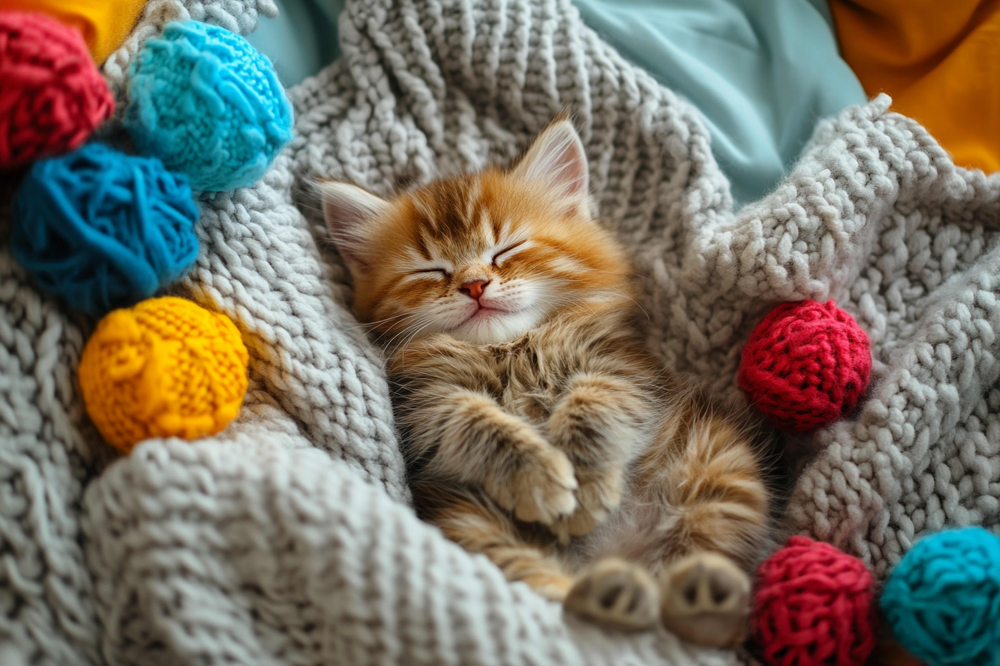

In [17]:
file_id = "1IKjM-BueAJw9xxXpCmQReWeWoKOzhv-j"
destination = "cats_balls.jpeg"
download_files(file_id, destination)


In [18]:
image="/content/sam3/cats_balls.jpeg"

# Run SAM3 Agent Inference with Qwen 3 VL

In [15]:
from functools import partial
from IPython.display import display, Image
from sam3.agent.client_llm import send_generate_request as send_generate_request_orig
from sam3.agent.client_sam3 import call_sam_service as call_sam_service_orig
from sam3.agent.inference import run_single_image_inference

/content/sam3/sam3/agent/agent_core.py:203: SyntaxWarning: assertion is always true, perhaps remove parentheses?
  assert (


------------------------------ Starting SAM 3 Agent Session... ------------------------------ 
> Text prompt: the leftmost red ball
> Image path: /content/sam3/cats_balls.jpeg



------------------------------ Round 1------------------------------



image_path /content/sam3/cats_balls.jpeg
🔍 Calling model qwen3_vl_8b_thinking...

>>> MLLM Response [start]
State that there is only one image in the message history (the raw input image). Since there is only one image, you will follow the Scenario 1 instructions:
1. Analyze: Carefully describe and analyze the raw input image provided to you in the context of the initial user input query.
The image shows a sleeping orange kitten surrounded by various colored yarn balls (red, blue, yellow) and knitted fabric. The yarn balls are scattered around the kitten. There is a leftmost red ball visible in the top-left corner of the image. The user is asking for "the leftmost red ball" which would be the red ball positioned farthest to the left.

2. T

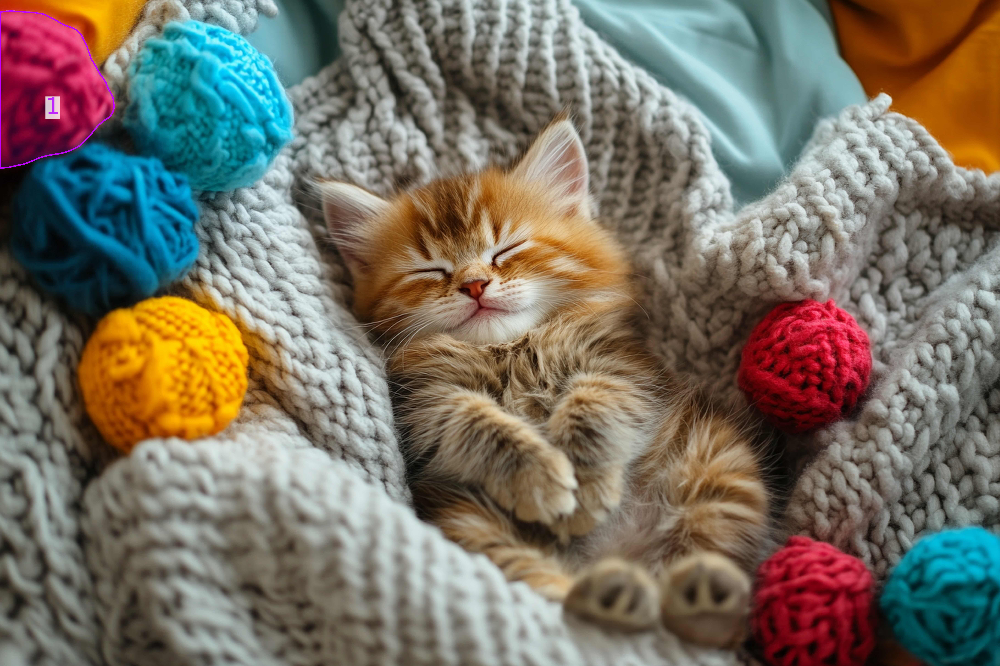

In [20]:
# prepare input args and run single image inference
prompt = "the leftmost red ball"
image = os.path.abspath(image)
send_generate_request = partial(send_generate_request_orig, server_url=LLM_SERVER_URL, model=llm_config["model"], api_key=llm_config["api_key"])
call_sam_service = partial(call_sam_service_orig, sam3_processor=processor)
output_image_path = run_single_image_inference(
    image, prompt, llm_config, send_generate_request, call_sam_service,
    debug=True, output_dir="agent_output"
)

# display output
if output_image_path is not None:
    display(Image(filename=output_image_path))